In [1]:
#Load required packages
%matplotlib inline
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
import pandas as pd
import cftime
from tqdm import tqdm
import cmocean as cm
import sys, os
from datetime import datetime

import numpy as np
import cartopy.crs as ccrs
from dask.distributed import Client
import cartopy.feature as cfeature
from matplotlib.patches import Rectangle
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
import matplotlib.ticker as mticker

In [2]:
# Load workers:
client = Client(threads_per_worker=1)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 28
Total threads: 28,Total memory: 126.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:34825,Workers: 28
Dashboard: /proxy/8787/status,Total threads: 28
Started: Just now,Total memory: 126.00 GiB
Comm: tcp://127.0.0.1:43359,Total threads: 1
Dashboard: /proxy/34357/status,Memory: 4.50 GiB
Nanny: tcp://127.0.0.1:33261,


## Weddell Sea MHWs – Analysis of Drivers and Statistics in the Seasonal Ice Zone

In [4]:
ds = xr.open_dataset('/scratch/e14/ts7341/mhw_stats_ws.nc')

In [5]:
ds

<xarray.Dataset> Size: 395MB
Dimensions:                 (lat: 66, lon: 320, event: 57)
Coordinates:
  * lon                     (lon) float64 3kB -59.88 -59.62 ... 19.62 19.88
  * lat                     (lat) float64 528B -69.99 -69.88 ... -63.17 -63.06
  * event                   (event) int64 456B 0 1 2 3 4 5 ... 51 52 53 54 55 56
Data variables:
    main_driver             (lat, lon, event) <U23 111MB ...
    main_driver_value       (lat, lon, event) float64 10MB ...
    secondary_driver        (lat, lon, event) <U23 111MB ...
    secondary_driver_value  (lat, lon, event) float64 10MB ...
    sub_driver              (lat, lon, event) <U17 82MB ...
    sub_driver_value        (lat, lon, event) float64 10MB ...
    breakdown_driver        (lat, lon, event) <U9 43MB ...
    breakdown_driver_value  (lat, lon, event) float64 10MB ...
    event_start_date        (lat, lon, event) datetime64[ns] 10MB ...

### Code for manuscript Figure 5

--- Top 10 Summers by MHW Grid Cells (Nov + Dec Combined) ---
summer_year
2017    15480
2011    12446
1990     9300
2005     9266
2018     8981
2024     8953
2007     7940
2020     7830
2013     6865
2021     5352
2002     5036
dtype: int64

Case Study Year: 2017
Other Top Years for comparison (N=10): [1990, 2002, 2005, 2007, 2011, 2013, 2018, 2020, 2021, 2024]


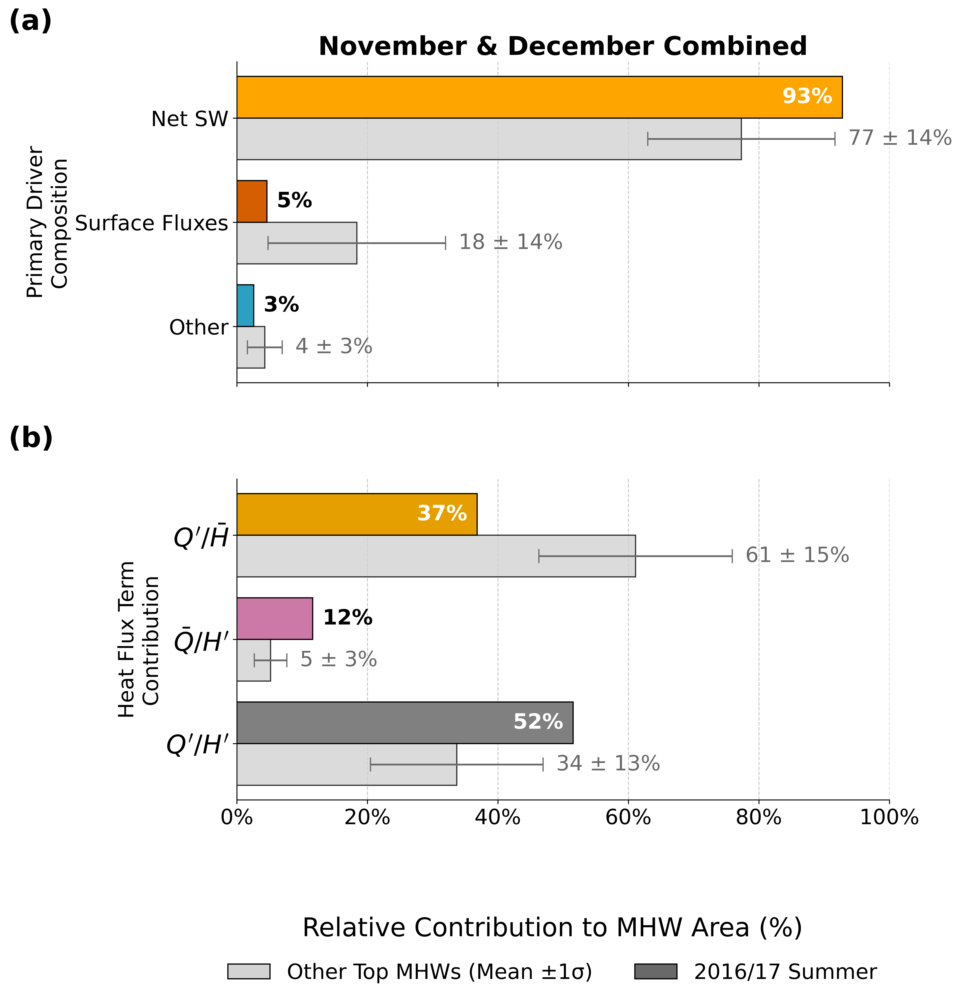

In [6]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.ticker as mticker
import calendar

# -----------------------------
# PLOT FORMATTING
# -----------------------------
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.labelsize': 22,
    'axes.titlesize': 22,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 18,
    'figure.dpi': 600,
})

# --- CONFIGURATION (Simplified Main Drivers) ---
simplified_drivers = ['Net Shortwave', 'Surface Fluxes Less SW', 'Other']
simplified_colors = {'Net Shortwave': 'orange', 'Surface Fluxes Less SW': '#D55E00', 'Other': '#2ca0c2'}
simplified_labels = {'Net Shortwave': 'Net SW', 'Surface Fluxes Less SW': 'Surface Fluxes', 'Other': 'Other'}

# --- CONFIGURATION (Sub-Drivers) ---
sub_drivers_list = ["Qprime_1ovrHbar", "Qbar_1ovrHprime", "Qprime_1ovrHprime"]
sub_driver_colors = {"Qprime_1ovrHbar": '#E69F00', "Qbar_1ovrHprime": '#CC79A7', "Qprime_1ovrHprime": 'grey'}
sub_term_labels = {"Qprime_1ovrHbar": r"$Q'/\bar{H}$", "Qbar_1ovrHprime": r"$\bar{Q}/H'$", "Qprime_1ovrHprime": r"$Q'/H'$"}

# --- ANALYSIS PARAMETERS ---
CASE_STUDY_YEAR = 2017
MONTHS_TO_PLOT = [11, 12]

# --- HELPER FUNCTIONS ---
def load_and_preprocess_data(file_path):
    ds = xr.open_dataset(file_path)
    df = ds.to_dataframe().reset_index().dropna(subset=['event_start_date', 'main_driver'])
    df['summer_year'] = np.where(df['event_start_date'].dt.month >= 11, df['event_start_date'].dt.year + 1, df['event_start_date'].dt.year)
    df['month'] = df['event_start_date'].dt.month
    conditions = [df['main_driver'] == 'Net Shortwave', df['main_driver'] == 'Surface Fluxes Less SW']
    choices = ['Net Shortwave', 'Surface Fluxes Less SW']
    df['simplified_driver'] = np.select(conditions, choices, default='Other')
    df = df[df['month'].isin(MONTHS_TO_PLOT)]
    return df

def find_top_summer_years(df, n=15):
    return df.groupby('summer_year').size().sort_values(ascending=False).head(n)

def calculate_proportions_stats(df, drivers, driver_var):
    """Calculates proportions for each year, then returns the mean and standard deviation."""
    if df.empty:
        return pd.Series(0, index=drivers), pd.Series(0, index=drivers)
    yearly_props = df.groupby('summer_year')[driver_var].value_counts(normalize=True).unstack(fill_value=0).reindex(columns=drivers, fill_value=0) * 100
    return yearly_props.mean(), yearly_props.std()

# <<< MODIFIED FUNCTION >>>
def plot_comparison_with_stddev(ax, df_subset, driver_var, drivers_list, colors, labels, case_study_year, other_top_years):
    # Data for the Case Study Year
    focus_df = df_subset[df_subset['summer_year'] == case_study_year]
    focus_props = focus_df[driver_var].value_counts(normalize=True).reindex(drivers_list, fill_value=0) * 100

    # Mean and Std Dev for Other Top Years
    other_df = df_subset[df_subset['summer_year'].isin(other_top_years)]
    mean_props_other, std_props_other = calculate_proportions_stats(other_df, drivers_list, driver_var)

    values_focus = [focus_props.get(d, 0) for d in drivers_list]
    values_other = [mean_props_other.get(d, 0) for d in drivers_list]
    errors_other = [std_props_other.get(d, 0) *.7 for d in drivers_list]

    y_pos = np.arange(len(drivers_list))
    bar_height = 0.4
    
    # Bar for "Other Years" with full standard deviation error bars
    ax.barh(y_pos + bar_height/2, values_other, height=bar_height, xerr=errors_other, capsize=6,
            color='lightgray', edgecolor='black', alpha=0.8, zorder=3, ecolor='dimgray')
    
    # Bar for "Focus Year"
    ax.barh(y_pos - bar_height/2, values_focus, height=bar_height,
            color=[colors[drv] for drv in drivers_list], edgecolor='black', zorder=3)

    ax.set_yticks(y_pos, labels=[labels.get(drv) for drv in drivers_list]); ax.invert_yaxis()
    ax.set_xlim(0, 100)
    
    # Minimalist aesthetic
    ax.xaxis.set_major_formatter(mticker.PercentFormatter())
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)

    # --- MODIFIED LABELING LOGIC ---
    # Add direct labels to bars with larger font size
    label_fontsize = 18

    # Labels for "Other Years" (Mean ± Std Dev)
    for i, val in enumerate(values_other):
        std_val = errors_other[i]
        label_text = f'{val:.0f} ± {std_val:.0f}%'
        ax.text(val + std_val + 2, y_pos[i] + bar_height/2, label_text,
                ha='left', va='center', color='dimgray', fontsize=label_fontsize)

    # Labels for "Focus Year" (placed inside the bar)
    for i, val in enumerate(values_focus):
        # If bar is long enough, put label inside
        if val > 15:
            ax.text(val - 1.5, y_pos[i] - bar_height/2, f'{val:.0f}%',
                    ha='right', va='center', color='white', weight='bold', fontsize=label_fontsize)
        # Otherwise, put it outside to avoid clutter
        else:
            ax.text(val + 1.5, y_pos[i] - bar_height/2, f'{val:.0f}%',
                    ha='left', va='center', color='black', weight='bold', fontsize=label_fontsize)

# --- MAIN EXECUTION ---
if __name__ == '__main__':
    try:
        file_path = '/scratch/e14/ts7341/mhw_stats_ws.nc'
        nov_dec_df = load_and_preprocess_data(file_path)
    except FileNotFoundError:
        print("Data file not found. Please check the path.")
        exit()


    ranked_summers = find_top_summer_years(nov_dec_df, n=11)
    print("--- Top 10 Summers by MHW Grid Cells (Nov + Dec Combined) ---")
    print(ranked_summers)
    
    top_10_summers = set(ranked_summers.index.tolist())
    # Ensure the case study year is handled correctly even if it's not in the top 10
    other_top_summers = list(top_10_summers - {CASE_STUDY_YEAR})
    
    print(f"\nCase Study Year: {CASE_STUDY_YEAR}")
    print(f"Other Top Years for comparison (N={len(other_top_summers)}): {sorted(other_top_summers)}")

    all_plot_years = [CASE_STUDY_YEAR] + other_top_summers
    plot_df = nov_dec_df[nov_dec_df['summer_year'].isin(all_plot_years)]

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 12), sharex=True)
    panel_labels = ['(a)', '(b)']
    
    # --- Top Panel: Main Drivers ---
    ax_main = axes[0]
    ax_main.set_title("November & December Combined", weight='bold')
    plot_comparison_with_stddev(ax_main, plot_df, 'simplified_driver', simplified_drivers, simplified_colors, simplified_labels, CASE_STUDY_YEAR, other_top_summers)
    ax_main.text(-0.35, 1.1, panel_labels[0], transform=ax_main.transAxes, size=24, weight='bold')
    ax_main.set_ylabel('Primary Driver\nComposition', fontsize=18)
    ax_main.tick_params(axis='y', labelsize=18)

    # --- Bottom Panel: Sub-Drivers with Uncertainty ---
    ax_sub = axes[1]
    surface_forced_df = plot_df[plot_df['main_driver'].isin(['Net Shortwave', 'Surface Fluxes Less SW'])]
    plot_comparison_with_stddev(ax_sub, surface_forced_df, 'sub_driver', sub_drivers_list, sub_driver_colors, sub_term_labels, CASE_STUDY_YEAR, other_top_summers)
    ax_sub.text(-0.35, 1.1, panel_labels[1], transform=ax_sub.transAxes, size=24, weight='bold')
    ax_sub.set_ylabel('Heat Flux Term\nContribution', fontsize=18)
    ax_sub.tick_params(axis='y', labelsize=22)
    
    fig.supxlabel('Relative Contribution to MHW Area (%)', fontsize=22)

    legend_elements = [
        Patch(facecolor='lightgray', edgecolor='k', label='Other Top MHWs (Mean ±1σ)'),
        Patch(facecolor='dimgray', edgecolor='k', label='2016/17 Summer'),
    ]
    fig.legend(handles=legend_elements, loc='lower center', ncol=2, bbox_to_anchor=(0.5, -0.05), frameon=False)
    
    fig.subplots_adjust(hspace=0.3, bottom=0.15)
    plt.savefig("/g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/mhw_composite_Weddell_Sea.png", dpi=800, bbox_inches='tight')
    plt.show()

### Compare with Other Post-2016 MHWs (this is not in the manuscript)

In [4]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.ticker as mticker
import calendar

# -----------------------------
# PLOT FORMATTING
# -----------------------------
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.labelsize': 22,
    'axes.titlesize': 22,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 18,
    'figure.dpi': 600,
})

# --- CONFIGURATION (Simplified Main Drivers) ---
simplified_drivers = ['Net Shortwave', 'Surface Fluxes Less SW', 'Other']
simplified_colors = {'Net Shortwave': 'orange', 'Surface Fluxes Less SW': '#D55E00', 'Other': '#2ca0c2'}
simplified_labels = {'Net Shortwave': 'Net SW', 'Surface Fluxes Less SW': 'Surface Fluxes', 'Other': 'Other'}

# --- CONFIGURATION (Sub-Drivers) ---
sub_drivers_list = ["Qprime_1ovrHbar", "Qbar_1ovrHprime", "Qprime_1ovrHprime"]
sub_driver_colors = {"Qprime_1ovrHbar": '#E69F00', "Qbar_1ovrHprime": '#CC79A7', "Qprime_1ovrHprime": 'grey'}
sub_term_labels = {"Qprime_1ovrHbar": r"$Q'/\bar{H}$", "Qbar_1ovrHprime": r"$\bar{Q}/H'$", "Qprime_1ovrHprime": r"$Q'/H'$"}

# --- ANALYSIS PARAMETERS ---
CASE_STUDY_YEAR = 2017
SPECIAL_COMPOSITE_YEARS = [2018, 2020, 2024]
SPECIAL_COMPOSITE_COLOR = '#a6bddb' # A muted blue for the new composite bar
MONTHS_TO_PLOT = [11, 12]

# --- HELPER FUNCTIONS ---
def load_and_preprocess_data(file_path):
    ds = xr.open_dataset(file_path)
    df = ds.to_dataframe().reset_index().dropna(subset=['event_start_date', 'main_driver'])
    df['summer_year'] = np.where(df['event_start_date'].dt.month >= 11, df['event_start_date'].dt.year + 1, df['event_start_date'].dt.year)
    df['month'] = df['event_start_date'].dt.month
    conditions = [df['main_driver'] == 'Net Shortwave', df['main_driver'] == 'Surface Fluxes Less SW']
    choices = ['Net Shortwave', 'Surface Fluxes Less SW']
    df['simplified_driver'] = np.select(conditions, choices, default='Other')
    df = df[df['month'].isin(MONTHS_TO_PLOT)]
    return df

def find_top_summer_years(df, n=15):
    return df.groupby('summer_year').size().sort_values(ascending=False).head(n)

def calculate_proportions_stats(df, drivers, driver_var):
    """Calculates proportions for each year, then returns the mean and standard deviation."""
    if df.empty:
        return pd.Series(0, index=drivers), pd.Series(0, index=drivers)
    yearly_props = df.groupby('summer_year')[driver_var].value_counts(normalize=True).unstack(fill_value=0).reindex(columns=drivers, fill_value=0) * 100
    return yearly_props.mean(), yearly_props.std()

def plot_three_way_comparison(ax, df_subset, driver_var, drivers_list, colors, labels, focus_year, special_years, other_years):
    # 1. Data for the Case Study Year (Focus)
    focus_df = df_subset[df_subset['summer_year'] == focus_year]
    focus_props = focus_df[driver_var].value_counts(normalize=True).reindex(drivers_list, fill_value=0) * 100

    # 2. Mean and Std Dev for the Special Composite Years
    special_df = df_subset[df_subset['summer_year'].isin(special_years)]
    mean_props_special, std_props_special = calculate_proportions_stats(special_df, drivers_list, driver_var)
    
    # 3. Mean and Std Dev for Other Top Years
    other_df = df_subset[df_subset['summer_year'].isin(other_years)]
    mean_props_other, std_props_other = calculate_proportions_stats(other_df, drivers_list, driver_var)

    # Prepare values for plotting
    values_focus = [focus_props.get(d, 0) for d in drivers_list]
    values_special = [mean_props_special.get(d, 0) for d in drivers_list]
    errors_special = [std_props_special.get(d, 0) for d in drivers_list]
    values_other = [mean_props_other.get(d, 0) for d in drivers_list]
    errors_other = [std_props_other.get(d, 0) for d in drivers_list]

    y_pos = np.arange(len(drivers_list))
    bar_height = 0.25
    
    # Plot the three bars, offset from the center y_pos
    ax.barh(y_pos + bar_height, values_other, height=bar_height, xerr=errors_other, capsize=5,
            color='lightgray', edgecolor='black', alpha=0.8, zorder=3, ecolor='dimgray')
    ax.barh(y_pos, values_special, height=bar_height, xerr=errors_special, capsize=5,
            color=SPECIAL_COMPOSITE_COLOR, edgecolor='black', zorder=3, ecolor='dimgray')
    ax.barh(y_pos - bar_height, values_focus, height=bar_height,
            color=[colors[drv] for drv in drivers_list], edgecolor='black', zorder=3)

    ax.set_yticks(y_pos, labels=[labels.get(drv) for drv in drivers_list]); ax.invert_yaxis()
    ax.set_xlim(0, 100)
    
    ax.xaxis.set_major_formatter(mticker.PercentFormatter())
    ax.spines['top'].set_visible(False); ax.spines['right'].set_visible(False)
    ax.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)

    label_fontsize = 15
    for i, val in enumerate(values_other):
        std = errors_other[i]
        ax.text(val + std + 2, y_pos[i] + bar_height, f'{val:.0f}±{std:.0f}%', ha='left', va='center', color='dimgray', fontsize=label_fontsize)
    for i, val in enumerate(values_special):
        std = errors_special[i]
        ax.text(val + std + 2, y_pos[i], f'{val:.0f}±{std:.0f}%', ha='left', va='center', color='black', fontsize=label_fontsize)
    for i, val in enumerate(values_focus):
        if val > 15:
            ax.text(val - 1.5, y_pos[i] - bar_height, f'{val:.0f}%', ha='right', va='center', color='white', weight='bold', fontsize=label_fontsize)
        else:
            ax.text(val + 1.5, y_pos[i] - bar_height, f'{val:.0f}%', ha='left', va='center', color='black', weight='bold', fontsize=label_fontsize)

# --- MAIN EXECUTION ---
if __name__ == '__main__':
    try:
        # <<< FIX IS HERE: Corrected the file path from 'ts7431' back to 'ts7341' >>>
        file_path = '/scratch/e14/ts7341/mhw_stats_ws.nc'
        nov_dec_df = load_and_preprocess_data(file_path)

        # --- All subsequent logic is now safely inside the 'try' block ---
        
        ranked_summers = find_top_summer_years(nov_dec_df, n=15)
        top_summers_set = set(ranked_summers.index)
        
        other_top_summers = list(top_summers_set - {CASE_STUDY_YEAR} - set(SPECIAL_COMPOSITE_YEARS))
        
        print("--- MHW Summer Year Grouping ---")
        print(f"Focus Year: {CASE_STUDY_YEAR}")
        print(f"Special Composite Years (N={len(SPECIAL_COMPOSITE_YEARS)}): {sorted(SPECIAL_COMPOSITE_YEARS)}")
        print(f"Other Top MHW Years (N={len(other_top_summers)}): {sorted(other_top_summers)}")

        all_plot_years = [CASE_STUDY_YEAR] + SPECIAL_COMPOSITE_YEARS + other_top_summers
        plot_df = nov_dec_df[nov_dec_df['summer_year'].isin(all_plot_years)]

        fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 12), sharex=True)
        panel_labels = ['(a)', '(b)']
        
        # Top Panel
        ax_main = axes[0]
        ax_main.set_title("November & December Combined", weight='bold')
        plot_three_way_comparison(ax_main, plot_df, 'simplified_driver', simplified_drivers, simplified_colors, simplified_labels,
                                  CASE_STUDY_YEAR, SPECIAL_COMPOSITE_YEARS, other_top_summers)
        ax_main.text(-0.35, 1.1, panel_labels[0], transform=ax_main.transAxes, size=24, weight='bold')
        ax_main.set_ylabel('Primary Driver\nComposition', fontsize=18)
        ax_main.tick_params(axis='y', labelsize=18)

        # Bottom Panel
        ax_sub = axes[1]
        surface_forced_df = plot_df[plot_df['main_driver'].isin(['Net Shortwave', 'Surface Fluxes Less SW'])]
        plot_three_way_comparison(ax_sub, surface_forced_df, 'sub_driver', sub_drivers_list, sub_driver_colors, sub_term_labels,
                                  CASE_STUDY_YEAR, SPECIAL_COMPOSITE_YEARS, other_top_summers)
        ax_sub.text(-0.35, 1.1, panel_labels[1], transform=ax_sub.transAxes, size=24, weight='bold')
        ax_sub.set_ylabel('Heat Flux Term\nContribution', fontsize=18)
        ax_sub.tick_params(axis='y', labelsize=22)
        
        fig.supxlabel('Relative Contribution to MHW Area (%)', fontsize=22)

        legend_elements = [
            Patch(facecolor='lightgray', edgecolor='k', label='Other Top MHWs (Mean ±1σ)'),
            Patch(facecolor=SPECIAL_COMPOSITE_COLOR, edgecolor='k', label="2018, '20, '24 MHWs (Mean ±1σ)"),
            Patch(facecolor='dimgray', edgecolor='k', label='2016/17 Summer'),
        ]
        fig.legend(handles=legend_elements, loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.05), frameon=False)
        
        fig.subplots_adjust(hspace=0.3, bottom=0.15)
        plt.savefig("/g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/mhw_dominant_driver_Weddell_Sea_3way.png", dpi=300, bbox_inches='tight')
        plt.show()

    except FileNotFoundError:
        print(f"Data file not found at: {file_path}")
        print("Please ensure the path is correct and the file exists.")

--- MHW Summer Year Grouping ---
Focus Year: 2017
Special Composite Years (N=3): [2018, 2020, 2024]
Other Top MHW Years (N=11): [1983, 1990, 1991, 2002, 2005, 2006, 2007, 2011, 2013, 2016, 2021]


### Figure 6 in Manuscript of Post-2016 Comparison

--- Comparing MHW Drivers for Summers: 2018, 2020, 2021, 2024 (Nov + Dec) ---


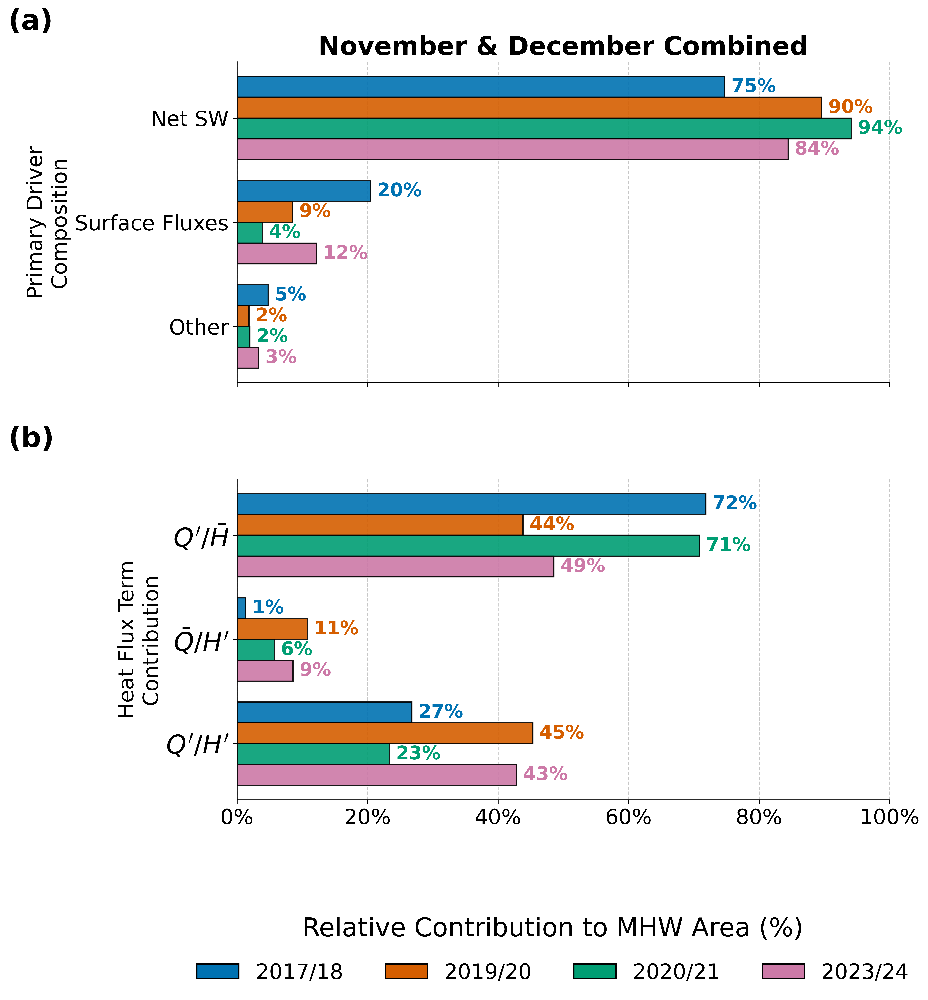

In [5]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.ticker as mticker
import calendar

# -----------------------------
# PLOT FORMATTING
# -----------------------------
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.labelsize': 22,
    'axes.titlesize': 22,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 18,
    'figure.dpi': 600,
})

# --- CONFIGURATION (Drivers and Terms) ---
simplified_drivers = ['Net Shortwave', 'Surface Fluxes Less SW', 'Other']
simplified_labels = {'Net Shortwave': 'Net SW', 'Surface Fluxes Less SW': 'Surface Fluxes', 'Other': 'Other'}

sub_drivers_list = ["Qprime_1ovrHbar", "Qbar_1ovrHprime", "Qprime_1ovrHprime"]
sub_term_labels = {"Qprime_1ovrHbar": r"$Q'/\bar{H}$", "Qbar_1ovrHprime": r"$\bar{Q}/H'$", "Qprime_1ovrHprime": r"$Q'/H'$"}

# --- ANALYSIS PARAMETERS ---
YEARS_TO_PLOT = [2018, 2020, 2021, 2024]
# Colorblind-friendly palette for the specific years
YEAR_COLORS = {2018: '#0072B2', 2020: '#D55E00', 2021: '#009E73', 2024: '#CC79A7'}
MONTHS_TO_PLOT = [11, 12]

# --- HELPER FUNCTIONS ---
def load_and_preprocess_data(file_path):
    """Loads and prepares the MHW dataset for analysis."""
    ds = xr.open_dataset(file_path)
    df = ds.to_dataframe().reset_index().dropna(subset=['event_start_date', 'main_driver'])
    df['summer_year'] = np.where(df['event_start_date'].dt.month >= 11, df['event_start_date'].dt.year + 1, df['event_start_date'].dt.year)
    df['month'] = df['event_start_date'].dt.month
    conditions = [df['main_driver'] == 'Net Shortwave', df['main_driver'] == 'Surface Fluxes Less SW']
    choices = ['Net Shortwave', 'Surface Fluxes Less SW']
    df['simplified_driver'] = np.select(conditions, choices, default='Other')
    df = df[df['month'].isin(MONTHS_TO_PLOT)]
    return df

def plot_multi_year_comparison(ax, df_subset, driver_var, drivers_list, labels, years_to_plot, year_colors):
    """
    Plots a direct comparison of MHW driver proportions for several individual years.
    """
    num_years = len(years_to_plot)
    y_pos = np.arange(len(drivers_list))
    
    # Define the height of the group of bars for each category and individual bar height
    total_group_height = 0.8
    bar_height = total_group_height / num_years

    # Loop through each year to plot its bar within the group
    for i, year in enumerate(years_to_plot):
        year_df = df_subset[df_subset['summer_year'] == year]
        
        if year_df.empty:
            print(f"Warning: No data found for year {year}. Skipping.")
            values = [0] * len(drivers_list)
        else:
            # Calculate proportions for this single year
            year_props = year_df[driver_var].value_counts(normalize=True).reindex(drivers_list, fill_value=0) * 100
            values = [year_props.get(d, 0) for d in drivers_list]

        # Calculate the vertical position for this year's bar
        # This centers the group of bars on the y-tick
        bar_y_position = y_pos - total_group_height / 2 + (i + 0.5) * bar_height
        
        ax.barh(bar_y_position, values, height=bar_height,
                color=year_colors[year], edgecolor='black', zorder=3, alpha=0.9)
        
        # Add direct percentage labels to the bars
        for j, val in enumerate(values):
            if val > 1: # Only label non-trivial bars
                ax.text(val + 1, bar_y_position[j], f'{val:.0f}%', ha='left', va='center', 
                        color=year_colors[year], weight='bold', fontsize=16)

    ax.set_yticks(y_pos, labels=[labels.get(drv) for drv in drivers_list])
    ax.invert_yaxis()
    ax.set_xlim(0, 100)
    
    # Minimalist aesthetic
    ax.xaxis.set_major_formatter(mticker.PercentFormatter())
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)

# --- MAIN EXECUTION ---
if __name__ == '__main__':
    file_path = '/scratch/e14/ts7341/mhw_stats_ws.nc'
    nov_dec_df = load_and_preprocess_data(file_path)

    # Filter the dataframe to only include the specific years for plotting
    plot_df = nov_dec_df[nov_dec_df['summer_year'].isin(YEARS_TO_PLOT)]
    
    print(f"--- Comparing MHW Drivers for Summers: {', '.join(map(str, YEARS_TO_PLOT))} (Nov + Dec) ---")

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 12), sharex=True)
    panel_labels = ['(a)', '(b)']
    
    # --- Top Panel: Main Drivers ---
    ax_main = axes[0]
    ax_main.set_title("November & December Combined", weight='bold')
    plot_multi_year_comparison(
        ax_main, plot_df, 'simplified_driver', simplified_drivers, simplified_labels,
        YEARS_TO_PLOT, YEAR_COLORS
    )
    ax_main.text(-0.35, 1.1, panel_labels[0], transform=ax_main.transAxes, size=24, weight='bold')
    ax_main.set_ylabel('Primary Driver\nComposition', fontsize=18)
    ax_main.tick_params(axis='y', labelsize=18)

    # --- Bottom Panel: Sub-Drivers ---
    ax_sub = axes[1]
    surface_forced_df = plot_df[plot_df['main_driver'].isin(['Net Shortwave', 'Surface Fluxes Less SW'])]
    plot_multi_year_comparison(
        ax_sub, surface_forced_df, 'sub_driver', sub_drivers_list, sub_term_labels,
        YEARS_TO_PLOT, YEAR_COLORS
    )
    ax_sub.text(-0.35, 1.1, panel_labels[1], transform=ax_sub.transAxes, size=24, weight='bold')
    ax_sub.set_ylabel('Heat Flux Term\nContribution', fontsize=18)
    ax_sub.tick_params(axis='y', labelsize=22)
    
    fig.supxlabel('Relative Contribution to MHW Area (%)', fontsize=22)

    # --- Create a legend for the years ---
    legend_elements = [
        Patch(facecolor=color, edgecolor='k', label=f"{year-1}/{str(year)[-2:]}") 
        for year, color in YEAR_COLORS.items() if year in YEARS_TO_PLOT
    ]
    fig.legend(handles=legend_elements, loc='lower center', ncol=len(YEARS_TO_PLOT), 
               bbox_to_anchor=(0.5, -0.05), frameon=False)
    
    fig.subplots_adjust(hspace=0.3, bottom=0.15)
    plt.savefig("/g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/mhw_dominant_driver_Weddell_Sea.png", dpi=800, bbox_inches='tight')
    plt.show()

### Time Series of Weddell Sea MHW Activity Since 1982

Total ocean grid cells in domain: 21120


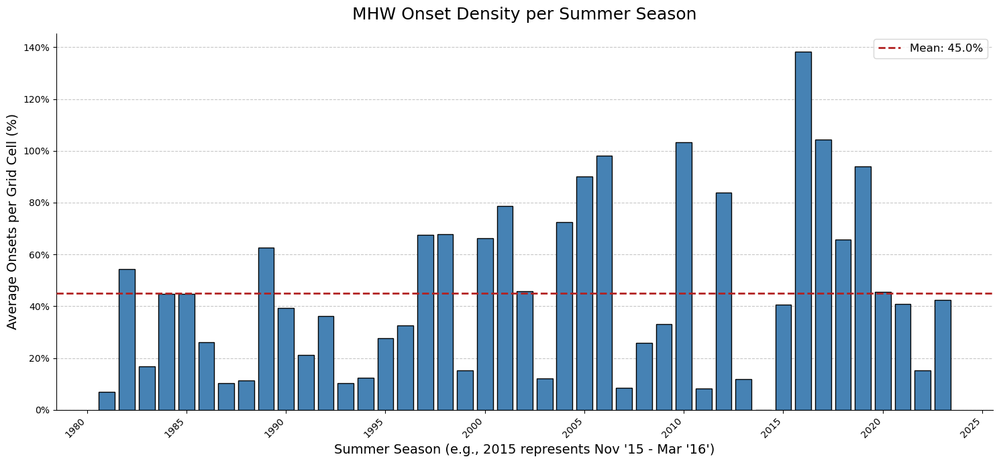

In [35]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

# ==============================================================================
# --- MAIN EXECUTION: NORMALIZED MHW ONSET DENSITY TIME SERIES ---
# ==============================================================================
if __name__ == '__main__':
    # --- STEP 1: LOAD DATASET ---
    file_path = '/scratch/e14/ts7341/mhw_stats_ws.nc'
    onset_ds_raw = xr.open_dataset(file_path)

    # --- STEP 2: DEFINE SEASON and CALCULATE 'season_year' ---
    season_months = [11, 12, 1, 2, 3]
    
    season_year = xr.where(
        onset_ds_raw['event_start_date'].dt.month.isin([11, 12]),
        onset_ds_raw['event_start_date'].dt.year,
        onset_ds_raw['event_start_date'].dt.year - 1
    )
    onset_ds_raw['season_year'] = season_year

    # --- STEP 3: CALCULATE THE NORMALIZATION FACTOR (TOTAL OCEAN AREA) ---
    total_ocean_cells = onset_ds_raw['main_driver'].isel(event=0).notnull().sum().item()
    print(f"Total ocean grid cells in domain: {total_ocean_cells}")

    # --- STEP 4: GROUP AND COUNT MHW ONSETS BY SEASON ---
    is_mhw = onset_ds_raw['event_start_date'].notnull()
    
    # --- *** THE FIX IS HERE *** ---
    # We must explicitly assign the 'season_year' coordinate to the new boolean DataArray.
    is_mhw['season_year'] = onset_ds_raw['season_year']

    # Filter for only the summer months before grouping
    is_summer_mhw = is_mhw.where(onset_ds_raw['event_start_date'].dt.month.isin(season_months))

    # Group by the 'season_year' and sum all events (True values) across all dimensions
    seasonal_mhw_counts = is_summer_mhw.groupby('season_year').sum(dim=['lat', 'lon', 'event'])

    # --- STEP 5: NORMALIZE THE COUNTS BY AREA ---
    normalized_seasonal_series = (seasonal_mhw_counts / total_ocean_cells) * 100

    # --- STEP 6: PLOT THE TIME SERIES ---
    fig, ax = plt.subplots(figsize=(15, 7))

    ax.bar(
        normalized_seasonal_series.season_year,
        normalized_seasonal_series.values,
        color='steelblue',
        edgecolor='black',
        zorder=3
    )
    
    mean_activity = normalized_seasonal_series.mean()
    ax.axhline(
        mean_activity, color='firebrick', linestyle='--', linewidth=2, zorder=4,
        label=f'Mean: {mean_activity.item():.1f}%'
    )

    # Formatting and Labels
    ax.set_title("MHW Onset Density per Summer Season", fontsize=18, pad=15)
    ax.set_ylabel("Average Onsets per Grid Cell (%)", fontsize=14)
    ax.set_xlabel("Summer Season (e.g., 2015 represents Nov '15 - Mar '16')", fontsize=14)
    ax.grid(axis='y', linestyle='--', alpha=0.7, zorder=0)
    ax.spines['top'].set_visible(False); ax.spines['right'].set_visible(False)
    ax.xaxis.set_major_locator(mticker.MaxNLocator(integer=True))
    plt.xticks(rotation=45, ha='right')
    ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=100))
    ax.legend(fontsize=12)
    plt.tight_layout()
    plt.show()

## Ross Sea MHWs – Primary Decay Mechanisms

## Analysis in the Ross Sea – Figure 9 in the Manuscript

Generating figures WITH numbers...


/jobfs/154291315.gadi-pbs/ipykernel_211645/3893374402.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig_combined.tight_layout(rect=[0.05, 0.05, 1, 0.92])



Generating and saving separate bar chart figure (NO NUMBERS)...


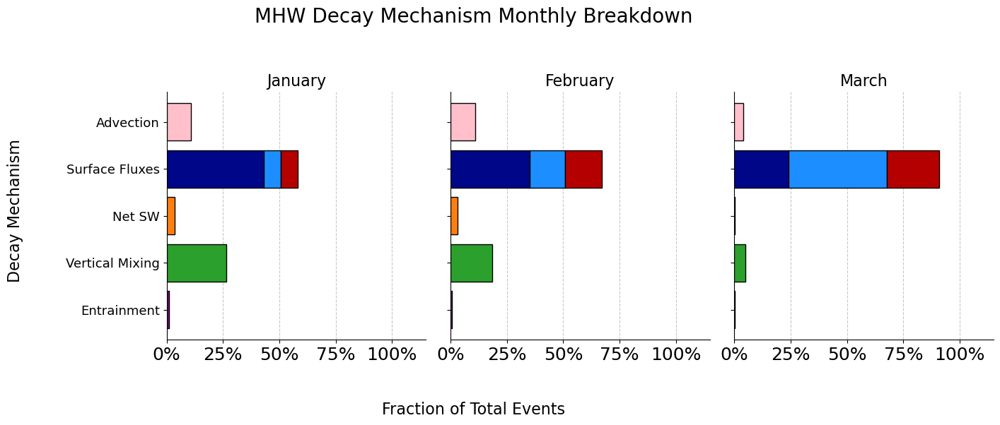


Done.


In [28]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Rectangle
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
import matplotlib.ticker as mticker
import calendar
from matplotlib.gridspec import GridSpec

# --- CONFIGURATION ---
surface_flux_components = ['lw_heat', 'evap_heat', 'sens_heat']
grouped_flux_name = 'Surface Fluxes Less SW'

# --- MAP CONFIGURATION ---
map_drivers = ['Grouped Advection', grouped_flux_name, 'Net Shortwave', 'Grouped Vertical Mixing', 'entrainment']
map_driver_colors = {
    "Grouped Advection": "#ffc0cb",       # <--- Custom Pink
    grouped_flux_name: "gray",
    "Net Shortwave": "#ff7f0e",         # <--- Custom Orange
    "Grouped Vertical Mixing": "#2ca02c",
    "entrainment": "purple",
    "No Data": '#d9d9d9'
}
map_driver_labels = {"Grouped Advection": "Advection", grouped_flux_name: "Surface Fluxes", "Net Shortwave": "Net SW", "Grouped Vertical Mixing": "Vertical Mixing", "entrainment": "Entrainment"}

# --- BAR CHART CONFIGURATION ---
barchart_display_drivers = ['Grouped Advection', grouped_flux_name, 'Net Shortwave', 'Grouped Vertical Mixing', 'entrainment', 'mh_flux']
barchart_display_labels = {'Grouped Advection': 'Advection', 'grouped_flux_name': 'Surface Fluxes', 'Net Shortwave': 'Net SW', 'Grouped Vertical Mixing': 'Vertical Mixing', 'entrainment': 'Entrainment', 'mh_flux': 'MH Flux'}
barchart_colors = {
    "Grouped Advection": "#ffc0cb",       # <--- Custom Pink
    "Net Shortwave": "#ff7f0e",         # <--- Custom Orange
    "Grouped Vertical Mixing": "#2ca02c",
    "entrainment": "purple",
    "lw_heat": "#000688",
    "sens_heat": "#b50000",
    "evap_heat": "#1d8eff",
    "mh_flux": "#984ea3"
}

# Map and analysis parameters
MIN_EVENTS_FOR_MAP = 5; RECT_LON_180 = (-200, -140); RECT_LAT = (-77, -72); PAD_LON = 10; PAD_LAT = 5
ZOOM_EXTENT = [RECT_LON_180[0] - PAD_LON, RECT_LON_180[1] + PAD_LON, RECT_LAT[0] - PAD_LAT, RECT_LAT[1] + PAD_LAT]
CENTRAL_LONGITUDE_MAP = 180

# --- HELPER FUNCTIONS ---
def normalize_longitude(ds: xr.Dataset) -> xr.Dataset:
    ds = ds.copy(); ds.coords['lon'] = (ds['lon'].values + 360) % 360; ds = ds.sortby('lon'); return ds

def compute_driver_fractions_vectorized(ds, drivers, driver_var):
    ds[driver_var] = ds[driver_var].where(ds[driver_var] != ''); ds_stacked = ds.stack(events=('event',))
    total_valid = ds_stacked[driver_var].notnull().sum(dim='events'); frac_ds = xr.Dataset(coords={'lat': ds.lat, 'lon': ds.lon})
    for drv in drivers:
        count = (ds_stacked[driver_var] == drv).sum(dim='events'); frac = xr.where(total_valid > 0, count / total_valid, np.nan); frac_ds[drv] = frac
    return frac_ds, total_valid

def plot_dominant_driver_map(ax_map, frac_ds, drivers, total_valid, colors, min_events, is_left_col=False, is_bottom_row=False):
    frac_array = xr.concat([frac_ds[drv] for drv in drivers], dim='driver'); mask = (total_valid < min_events); frac_array_filled = frac_array.fillna(-1)
    dominant_idx = frac_array_filled.argmax(dim='driver', skipna=False); dominant_idx_masked = dominant_idx.where(~mask)
    cmap = mcolors.ListedColormap([colors[drv] for drv in drivers])
    dominant_idx_masked.plot.pcolormesh(ax=ax_map, cmap=cmap, vmin=-0.5, vmax=len(drivers)-0.5, transform=ccrs.PlateCarree(), add_colorbar=False)
    ax_map.add_feature(cfeature.LAND, facecolor=colors.get('No Data', '#d9d9d9'), zorder=5); ax_map.coastlines(zorder=5)
    rect = Rectangle((RECT_LON_180[0], RECT_LAT[0]), RECT_LON_180[1]-RECT_LON_180[0], RECT_LAT[1]-RECT_LAT[0], linewidth=1.5, edgecolor='black', facecolor='none', linestyle='--', transform=ccrs.PlateCarree(), zorder=6)
    ax_map.add_patch(rect); gl = ax_map.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False; gl.right_labels = False; gl.left_labels = is_left_col; gl.bottom_labels = is_bottom_row
    gl.xlabel_style = {'size': 10}; gl.ylabel_style = {'size': 10}; ax_map.set_extent(ZOOM_EXTENT, crs=ccrs.PlateCarree())

def plot_summary_barchart_with_stacking(ax_bar, all_valid_events_series, display_drivers, display_labels, colors, stacked_driver_name, stack_components, is_first_chart=False, show_numbers=True):
    total_event_count = len(all_valid_events_series)
    if show_numbers:
        ax_bar.text(0.98, 0.02, r"$\mathit{N = %d}$" % total_event_count, transform=ax_bar.transAxes, ha='right', va='bottom', fontsize=10, bbox=dict(facecolor='white', alpha=0.6, edgecolor='none', boxstyle='round,pad=0.2'))
    
    if total_event_count == 0:
        ax_bar.text(0.5, 0.5, "No Events", ha='center', va='center', transform=ax_bar.transAxes, fontsize=12); ax_bar.set_xlim(0, 1.15); ax_bar.set_yticks([]); return
    
    y_tick_labels = [display_labels.get(drv, 'Surface Fluxes') for drv in display_drivers]
    event_counts = all_valid_events_series.value_counts()
    y_pos = np.arange(len(display_drivers)); ax_bar.set_yticks(y_pos, labels=y_tick_labels)

    ax_bar.tick_params(axis='y', labelsize=13)
    ax_bar.tick_params(axis='x', labelsize=18)

    for i, drv in enumerate(display_drivers):
        if drv == grouped_flux_name:
            current_left = 0
            for component in stack_components:
                count = event_counts.get(component, 0); frac = count / total_event_count
                if frac == 0: continue
                ax_bar.barh(i, frac, left=current_left, height=0.8, color=colors[component], edgecolor='black', zorder=3)
                if show_numbers and frac > 0.02:
                    label_text = f'{frac:.1%}'
                    label_x_pos = current_left + frac / 2
                    if is_first_chart:
                        if component == 'lw_heat': ax_bar.text(label_x_pos, i, label_text, color='white', va='center', ha='center', fontsize=13)
                        elif component == 'sens_heat': ax_bar.text(label_x_pos, i - 0.45, label_text, color='black', va='bottom', ha='center', fontsize=13)
                        elif component == 'evap_heat': ax_bar.text(label_x_pos, i + 0.45, label_text, color='black', va='top', ha='center', fontsize=13)
                    else:
                        ax_bar.text(label_x_pos, i, label_text, color='white', va='center', ha='center', fontsize=13)
                current_left += frac
        else:
            count = event_counts.get(drv, 0); frac = count / total_event_count
            if frac == 0: continue
            ax_bar.barh(i, frac, height=0.8, color=colors[drv], edgecolor='black', zorder=3)
            if show_numbers:
                ax_bar.text(frac + 0.01, i, f'{frac:.1%}', color='black', va='center', ha='left', fontsize=13)

    ax_bar.invert_yaxis(); ax_bar.set_xlim(0, 1.15)
    ax_bar.set_xticks([0, 0.25, 0.5, 0.75, 1.0])
    ax_bar.xaxis.set_major_formatter(mticker.PercentFormatter(1.0))
    ax_bar.grid(axis='x', linestyle='--', alpha=0.7, zorder=0); ax_bar.spines['right'].set_visible(False); ax_bar.spines['top'].set_visible(False)

# ==============================================================================
# --- MAIN EXECUTION ---
# ==============================================================================
if __name__ == '__main__':
    decay_ds_raw = xr.open_dataset('/scratch/e14/ts7341/mhw_decay_Ross_Sea.nc')

    decay_ds = normalize_longitude(decay_ds_raw)
    months_to_plot = range(1, 4); num_months = len(months_to_plot)
    
    # --- Generate and save the version WITH numbers ---
    print("Generating figures WITH numbers...")
    fig_combined = plt.figure(figsize=(18, 10), dpi=600)
    gs = GridSpec(nrows=2, ncols=num_months, height_ratios=(3, 2), hspace=0.35, wspace=0.1)
    axes_maps = [fig_combined.add_subplot(gs[0, i], projection=ccrs.Mercator(central_longitude=CENTRAL_LONGITUDE_MAP)) for i in range(num_months)]
    axes_bars = [fig_combined.add_subplot(gs[1, 0])]; axes_bars.extend([fig_combined.add_subplot(gs[1, i], sharey=axes_bars[0], sharex=axes_bars[0]) for i in range(1, num_months)])
    for i, month in enumerate(months_to_plot):
        col = i; month_name = calendar.month_name[month]
        ax_map = axes_maps[col]; ax_bar = axes_bars[col]
        month_ds = decay_ds.where(decay_ds['event_end_date'].dt.month == month, drop=True)
        frac_ds_map, total_valid_map = compute_driver_fractions_vectorized(month_ds, map_drivers, 'main_decay_driver')
        plot_dominant_driver_map(ax_map, frac_ds_map, map_drivers, total_valid_map, map_driver_colors, MIN_EVENTS_FOR_MAP, is_left_col=(col == 0), is_bottom_row=True)
        ax_map.set_title(month_name, fontsize=18, pad=10)
        hybrid_driver = xr.where(month_ds['main_decay_driver'] == grouped_flux_name, month_ds['breakdown_driver'], month_ds['main_decay_driver'])
        all_valid_events = hybrid_driver.stack(z=('lat', 'lon', 'event')).to_series().dropna(); all_valid_events = all_valid_events[all_valid_events != '']
        plot_summary_barchart_with_stacking(ax_bar, all_valid_events, barchart_display_drivers, barchart_display_labels, barchart_colors, grouped_flux_name, surface_flux_components, is_first_chart=(col == 0), show_numbers=True)
        if col != 0: ax_bar.set_ylabel(''); plt.setp(ax_bar.get_yticklabels(), visible=False)
    fig_combined.suptitle(f"MHW Decay Mechanism Analysis (Min. {MIN_EVENTS_FOR_MAP} Events/Gridcell)", fontsize=24, y=0.99)
    handles = [Line2D([0], [0], marker='s', color='w', label=map_driver_labels[drv], markerfacecolor=map_driver_colors[drv], markersize=15) for drv in map_drivers]
    fig_combined.legend(handles=handles, loc='upper center', ncol=len(map_drivers), fontsize=16, bbox_to_anchor=(0.5, 0.94), frameon=False)
    fig_combined.supxlabel('Fraction of Total Events', fontsize=18, y=0.02); fig_combined.supylabel('Decay Mechanism', fontsize=18, x=0.07)
    fig_combined.tight_layout(rect=[0.05, 0.05, 1, 0.92])
    fig_combined.savefig("monthly_decay_analysis_combined_final.png", dpi=600, bbox_inches='tight')
    plt.show(fig_combined)

    # --- Generate and save the version WITHOUT numbers ---
    print("\nGenerating and saving separate bar chart figure (NO NUMBERS)...")
    fig_bars_no_nums, axes_bars_only_no_nums = plt.subplots(1, num_months, figsize=(15, 6), sharey=True, sharex=True)
    if num_months == 1: axes_bars_only_no_nums = [axes_bars_only_no_nums]
    for i, month in enumerate(months_to_plot):
        col = i; month_name = calendar.month_name[month]
        ax_bar = axes_bars_only_no_nums[col]
        ax_bar.set_title(month_name, fontsize=16)
        month_ds = decay_ds.where(decay_ds['event_end_date'].dt.month == month, drop=True)
        hybrid_driver = xr.where(month_ds['main_decay_driver'] == grouped_flux_name, month_ds['breakdown_driver'], month_ds['main_decay_driver'])
        all_valid_events = hybrid_driver.stack(z=('lat', 'lon', 'event')).to_series().dropna(); all_valid_events = all_valid_events[all_valid_events != '']
        plot_summary_barchart_with_stacking(ax_bar, all_valid_events, barchart_display_drivers, barchart_display_labels, barchart_colors, grouped_flux_name, surface_flux_components, is_first_chart=(col == 0), show_numbers=False)
        if col != 0: ax_bar.set_ylabel(''); plt.setp(ax_bar.get_yticklabels(), visible=False)
    fig_bars_no_nums.suptitle("MHW Decay Mechanism Monthly Breakdown", fontsize=20, y=0.98)
    fig_bars_no_nums.supxlabel('Fraction of Total Events', fontsize=16, y=0.01)
    fig_bars_no_nums.supylabel('Decay Mechanism', fontsize=16, x=0.06)
    fig_bars_no_nums.tight_layout(rect=[0.08, 0.05, 1, 0.92])
    fig_bars_no_nums.savefig("/g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/monthly_decay_barcharts_only_no_numbers.png", dpi=600, bbox_inches='tight')
    plt.show(fig_bars_no_nums)

    print("\nDone.")

### Ross Sea MHW Statistics by Driver

In [34]:
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. PLOT FORMATTING & CONFIGURATION ---
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.labelsize': 22,
    'axes.titlesize': 22,
    'xtick.labelsize': 18,
    'ytick.labelsize': 22,
    'legend.fontsize': 18,
    'figure.dpi': 600,
})

# --- FIXED: Driver Colors and Labels for the MAIN DRIVERS ---
# Using the exact keys from the previous error message
MAIN_DRIVER_COLORS = {
    'Grouped Advection': '#1f77b4',
    'Grouped Vertical Mixing': '#ff7f0e',
    'Net Shortwave': '#2ca02c',
    'entrainment': '#d62728',
    'Surface Fluxes Less SW': '#9467bd'
}
# The labels can be the same as the keys for clarity
MAIN_DRIVER_LABELS = {
    'Grouped Advection': 'Grouped Advection',
    'Grouped Vertical Mixing': 'Grouped Vertical Mixing',
    'Net Shortwave': 'Net Shortwave',
    'entrainment': 'Entrainment',
    'Surface Fluxes Less SW': 'Surface Fluxes (no SW)'
}

# --- Analysis Parameters ---
MONTHS_TO_ANALYZE = [11, 12]
SAVE_PLOT_PATH = 'mhw_main_driver_distributions_horizontal.png'

# --- Data & Binning Configuration ---
PATH_TO_DRIVER_DS = '/scratch/e14/ts7341/mhw_decay_Ross_Sea.nc'
PATH_TO_MHW_STATS_DS = '/g/data/e14/ts7341/Figure_Code_For_Manuscript/Science/full_MHW_data_1982_2024_RS.nc'
LAT_BINS = np.arange(-77, -69, 2)
LON_BINS = np.arange(-210, -129, 10)

# --- 2. HELPER FUNCTION ---

def safe_mode(series):
    """Calculates the mode of a series, returning np.nan if the mode is empty."""
    modes = series.mode()
    return modes.iloc[0] if not modes.empty else np.nan

def load_and_aggregate_data(driver_path, stats_path, lat_bins, lon_bins, months):
    """Loads, preprocesses, and aggregates pixel data into regional events."""
    print("--- Loading and aggregating data ---")
    ds_driver = xr.open_dataset(driver_path)
    ds_mhw = xr.open_dataset(stats_path)

    common_lats = np.intersect1d(ds_driver['lat'], ds_mhw['lat'])
    common_lons = np.intersect1d(ds_driver['lon'], ds_mhw['lon'])
    ds_driver_aligned = ds_driver.sel(lat=common_lats, lon=common_lons)
    ds_mhw_aligned = ds_mhw.sel(lat=common_lats, lon=common_lons)
    print(f"Aligned datasets to common grid size: lat={len(common_lats)}, lon={len(common_lons)}")
    
    # --- FIXED: Use 'main_decay_driver' for the analysis ---
    ds_combined = xr.merge([
        ds_driver_aligned['main_decay_driver'].rename('driver'),
        ds_mhw_aligned['duration'],
        ds_mhw_aligned['intensity_mean'],
        ds_mhw_aligned['date_end']
    ])

    df_pixels = ds_combined.to_dataframe().reset_index().dropna(subset=['driver', 'duration', 'intensity_mean', 'date_end'])
    df_pixels['driver'] = df_pixels['driver'].str.strip()
    df_pixels = df_pixels[df_pixels['driver'] != '']
    
    df_pixels['date_end'] = pd.to_datetime(df_pixels['date_end'])
    df_pixels['month'] = df_pixels['date_end'].dt.month

    df_filtered = df_pixels[df_pixels['month'].isin(months)].copy()
    df_filtered['lat_bin'] = pd.cut(df_filtered['lat'], bins=lat_bins, right=False)
    df_filtered['lon_bin'] = pd.cut(df_filtered['lon'], bins=lon_bins, right=False)
    df_filtered['year'] = df_filtered['date_end'].dt.year
    df_filtered.dropna(subset=['lat_bin', 'lon_bin'], inplace=True)
    
    if df_filtered.empty:
        print("Warning: DataFrame is empty after spatial and temporal filtering.")
        return pd.DataFrame()

    group_key = ['year', 'month', 'lat_bin', 'lon_bin']
    df_regional_events = df_filtered.groupby(group_key, observed=True).agg(
        dominant_driver=('driver', safe_mode),
        mean_duration=('duration', 'mean'),
        mean_intensity=('intensity_mean', 'mean'),
    ).reset_index()
    df_regional_events.dropna(subset=['dominant_driver'], inplace=True)
    
    print(f"Found unique drivers: {df_regional_events['dominant_driver'].unique()}")
    print(f"Aggregated into {len(df_regional_events)} distinct regional events.")
    return df_regional_events


# --- 3. MAIN EXECUTION ---
if __name__ == '__main__':
    regional_events_df = load_and_aggregate_data(
        PATH_TO_DRIVER_DS, PATH_TO_MHW_STATS_DS, LAT_BINS, LON_BINS, MONTHS_TO_ANALYZE
    )

    if regional_events_df.empty:
        print("No data available to plot. Exiting.")
    else:
        # --- NO FILTERING NEEDED ---
        # The dictionaries now cover all expected main drivers.
        
        driver_order = regional_events_df.groupby('dominant_driver')['mean_duration'].median().sort_values(ascending=False).index.tolist()
        ytick_labels_ordered = [MAIN_DRIVER_LABELS.get(drv, drv) for drv in driver_order]

        fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(18, 8), sharey=True)
        fig.suptitle('MHW Regional Event Characteristics by Dominant Main Driver\n(Events Ending in November or December)',
                     fontsize=22, weight='bold')

        # Panel (a): Duration
        ax_dur = axes[0]
        sns.boxplot(ax=ax_dur, data=regional_events_df, y='dominant_driver', x='mean_duration',
                    order=driver_order, palette=MAIN_DRIVER_COLORS, orient='h', fliersize=3, linewidth=1.5)
        ax_dur.set_title("Duration Distribution", weight='bold')
        ax_dur.set_xlabel("Mean Duration (days)")
        ax_dur.set_ylabel("")
        ax_dur.set_yticklabels(ytick_labels_ordered)
        ax_dur.text(-0.25, 1.0, '(a)', transform=ax_dur.transAxes, size=24, weight='bold')

        # Panel (b): Intensity
        ax_int = axes[1]
        sns.boxplot(ax=ax_int, data=regional_events_df, y='dominant_driver', x='mean_intensity',
                    order=driver_order, palette=MAIN_DRIVER_COLORS, orient='h', fliersize=3, linewidth=1.5)
        ax_int.set_title("Mean Intensity Distribution", weight='bold')
        ax_int.set_xlabel("Mean Intensity (°C)")
        ax_int.set_ylabel("")
        ax_int.text(-0.1, 1.0, '(b)', transform=ax_int.transAxes, size=24, weight='bold')

        # Aesthetics for both panels
        for ax in axes:
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)
            counts = regional_events_df['dominant_driver'].value_counts()
            for i, driver in enumerate(driver_order):
                count = counts.get(driver, 0)
                ax.text(ax.get_xlim()[1] * 1.01, i, f" n={count}", ha='left', va='center', fontsize=16, color='dimgray')

        fig.subplots_adjust(top=0.88, wspace=0.2)
        if SAVE_PLOT_PATH:
            print(f"Saving plot to {SAVE_PLOT_PATH}")
            plt.savefig(SAVE_PLOT_PATH, dpi=300, bbox_inches='tight')
        plt.show()

--- Loading and aggregating data ---
Aligned datasets to common grid size: lat=66, lon=280
Found unique drivers: ['Surface Fluxes Less SW' 'Grouped Advection' 'Grouped Vertical Mixing'
 'Net Shortwave' 'entrainment']
Aggregated into 412 distinct regional events.


/jobfs/154270895.gadi-pbs/ipykernel_866407/339537629.py:132: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=ax_dur, data=regional_events_df, y='dominant_driver', x='mean_duration',
/jobfs/154270895.gadi-pbs/ipykernel_866407/339537629.py:137: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_dur.set_yticklabels(ytick_labels_ordered)
/jobfs/154270895.gadi-pbs/ipykernel_866407/339537629.py:142: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=ax_int, data=regional_events_df, y='dominant_driver', x='mean_intensity',


Saving plot to mhw_main_driver_distributions_horizontal.png


## Two-Phased Heating – Supplementary Figure 10

In [33]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import calendar

# --- Set global plotting parameters for a high-quality figure ---
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'font.size': 26,
    'axes.labelsize': 28,
    'axes.titlesize': 22,
    'legend.fontsize': 18,
    'xtick.labelsize': 24,
    'ytick.labelsize': 24,
    'text.color': 'black',
    'axes.labelcolor': 'black',
    'xtick.color': 'black',
    'ytick.color': 'black',
    'figure.dpi': 300,
})

# --- CONFIGURATION (UNCHANGED) ---
combined_drivers = [
    'Grouped Advection', 'Net Shortwave', 'Grouped Vertical Mixing', 'entrainment',
    'lw_heat', 'evap_heat', 'sens_heat', 'mh_flux'
]
combined_colors = {
    "Grouped Advection": "blue",
    "Net Shortwave": "orange",
    "Grouped Vertical Mixing": "green",
    "entrainment": "purple",
    "lw_heat": "#e41a1c",
    "evap_heat": "#377eb8",
    "sens_heat": "#4daf4a",
    "mh_flux": "#984ea3",
}
combined_labels = {
    "Grouped Advection": "Advection",
    "Net Shortwave": "Net SW",
    "Grouped Vertical Mixing": "Vertical Mixing",
    "entrainment": "Entrainment",
    "lw_heat": "Longwave",
    "evap_heat": "Latent Heat",
    "sens_heat": "Sensible Heat",
    "mh_flux": "Melt"
}

# --- PLOTTING HELPER FUNCTION (MODIFIED) ---
def plot_probability_distribution(ax, percentages, drivers, colors, labels):
    """
    Plots a normalized probability distribution horizontal bar chart on a given axis.
    """
    values = [percentages.get(drv, 0) for drv in drivers]
    bar_colors = [colors[drv] for drv in drivers]
    y_labels = [labels[drv] for drv in drivers]
    
    y_pos = np.arange(len(drivers))
    bars = ax.barh(y_pos, values, color=bar_colors, align='center', edgecolor='black', zorder=3)
    
    ax.set_yticks(y_pos)
    ax.set_yticklabels(y_labels)
    ax.set_xlim(0, 100)
    ax.xaxis.set_major_formatter(mticker.PercentFormatter())
    ax.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)
    ax.invert_yaxis()
    
    for bar in bars:
        width = bar.get_width()
        if width > 0.1:
            # INCREASED FONT SIZE FROM 16 to 18
            ax.annotate(f'{width:.1f}%',
                        xy=(width, bar.get_y() + bar.get_height() / 2),
                        xytext=(5, 0), textcoords="offset points",
                        ha='left', va='center', fontsize=22)
            
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

# --- DATA CALCULATION HELPER (UNCHANGED) ---
def calculate_drivers(month_ds):
    """Calculates the driver percentages from a monthly dataset."""
    main_drivers_series = month_ds['main_onset_driver'].stack(z=('lat', 'lon', 'event')).to_series().dropna()
    main_drivers_series = main_drivers_series[main_drivers_series != '']
    breakdown_series = month_ds['breakdown_driver'].stack(z=('lat', 'lon', 'event')).to_series().dropna()
    breakdown_series = breakdown_series[breakdown_series != '']
    total_events = len(main_drivers_series)
    
    if total_events == 0:
        return None, 0

    main_driver_counts = main_drivers_series.value_counts()
    breakdown_driver_counts = breakdown_series.value_counts()
    
    event_counts = {}
    for drv in ['Grouped Advection', 'Net Shortwave', 'Grouped Vertical Mixing', 'entrainment']:
        event_counts[drv] = main_driver_counts.get(drv, 0)
    for drv in ['lw_heat', 'evap_heat', 'sens_heat', 'mh_flux']:
        event_counts[drv] = breakdown_driver_counts.get(drv, 0)
    
    percentages = {key: (value / total_events) * 100 for key, value in event_counts.items()}
    return percentages, total_events

# ==============================================================================
# --- MAIN EXECUTION for 2016-17 vs 2022-23 Comparison ---
# ==============================================================================
if __name__ == '__main__':
    file_path = '/scratch/e14/ts7341/mhw_onset_Ross_Sea.nc'
    onset_ds_raw = xr.open_dataset(file_path)
    onset_ds = onset_ds_raw
    date_variable_name = 'event_start_date'

    # --- Create INCLUSION mask for the 2016-2017 summer ---
    print("Creating mask for 2016-2017 summer...")
    inclusion_mask_1617 = (
        ((onset_ds[date_variable_name].dt.month == 12) & (onset_ds[date_variable_name].dt.year == 2016)) |
        ((onset_ds[date_variable_name].dt.month == 1)  & (onset_ds[date_variable_name].dt.year == 2017)) |
        ((onset_ds[date_variable_name].dt.month == 2)  & (onset_ds[date_variable_name].dt.year == 2017))
    )
    onset_ds_1617 = onset_ds.where(inclusion_mask_1617, drop=True)

    # --- Create INCLUSION mask for the 2022-2023 summer ---
    print("Creating mask for 2022-2023 summer...")
    inclusion_mask_2223 = (
        ((onset_ds[date_variable_name].dt.month == 12) & (onset_ds[date_variable_name].dt.year == 2022)) |
        ((onset_ds[date_variable_name].dt.month == 1)  & (onset_ds[date_variable_name].dt.year == 2023)) |
        ((onset_ds[date_variable_name].dt.month == 2)  & (onset_ds[date_variable_name].dt.year == 2023))
    )
    onset_ds_2223 = onset_ds.where(inclusion_mask_2223, drop=True)
    
    # --- SETUP PLOT GRID: 3 rows (for months), 2 columns (for years) ---
    fig, axes = plt.subplots(
        nrows=3, ncols=2, figsize=(22, 28), sharex=True
    )
    
    months_to_plot = [12, 1, 2]
    
    print("Generating side-by-side probability distributions...")
    for i, month in enumerate(months_to_plot):
        month_name = calendar.month_name[month]
        
        # --- Column 0: 2016-2017 Data ---
        ax_left = axes[i, 0]
        month_ds_1617 = onset_ds_1617.where(onset_ds_1617[date_variable_name].dt.month == month, drop=True)
        percentages_1617, total_events_1617 = calculate_drivers(month_ds_1617)
        
        if percentages_1617:
            plot_probability_distribution(ax_left, percentages_1617, combined_drivers, combined_colors, combined_labels)
            # CHANGED to "N ="
            ax_left.set_title(f"{month_name}\n(N = {total_events_1617} events)", fontsize=22)
        else:
            ax_left.text(0.5, 0.5, "No Events Found", ha='center', va='center', transform=ax_left.transAxes, fontsize=20)
            ax_left.set_title(f"{month_name}", fontsize=22)
            ax_left.set_yticklabels([])

        # --- Column 1: 2022-2023 Data ---
        ax_right = axes[i, 1]
        month_ds_2223 = onset_ds_2223.where(onset_ds_2223[date_variable_name].dt.month == month, drop=True)
        percentages_2223, total_events_2223 = calculate_drivers(month_ds_2223)

        if percentages_2223:
            plot_probability_distribution(ax_right, percentages_2223, combined_drivers, combined_colors, combined_labels)
            # CHANGED to "N =" and standardized font size
            ax_right.set_title(f"{month_name}\n(N = {total_events_2223} events)", fontsize=22)
        else:
            ax_right.text(0.5, 0.5, "No Events Found", ha='center', va='center', transform=ax_right.transAxes, fontsize=20)
            ax_right.set_title(f"{month_name}", fontsize=22)
        
        # --- Clean up labels ---
        ax_right.set_yticklabels([])

    # --- Add Column Titles to the top plots ---
    axes[0, 0].set_title(f"Summer 2016-2017\n{axes[0, 0].get_title()}", fontweight='bold')
    axes[0, 1].set_title(f"Summer 2022-2023\n{axes[0, 1].get_title()}", fontweight='bold')

    # --- FINALIZE PLOT ---
    fig.suptitle("Comparison of MHW Onset Drivers: Summer 2016-17 vs 2022-23", fontsize=28)
    fig.supxlabel("Percentage of Total Events (%)", fontsize=24)
    plt.tight_layout(rect=[0.05, 0.03, 1, 0.95])
    fig.savefig("/g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/comparison_onset_drivers_1617_vs_2223_updated_labels.png", dpi=300)
    plt.show()
    print("Done.")

Creating mask for 2016-2017 summer...
Creating mask for 2022-2023 summer...
Generating side-by-side probability distributions...


Done.


# Breakdown MHW Properties – We use this in a Supplementary Figure for the Weddell Sea

--- Step 1: Loading Data ---
Loading driver data from: /scratch/e14/ts7341/mhw_stats_ws.nc
Loading MHW stats from: /scratch/e14/ts7341/SEANOE/MHW_Statistics_Mask/full_MHW_data_1982_2024_WS.nc

Driver Dataset Info:
<xarray.Dataset> Size: 395MB
Dimensions:                 (lat: 66, lon: 320, event: 57)
Coordinates:
  * lon                     (lon) float64 3kB -59.88 -59.62 ... 19.62 19.88
  * lat                     (lat) float64 528B -69.99 -69.88 ... -63.17 -63.06
  * event                   (event) int64 456B 0 1 2 3 4 5 ... 51 52 53 54 55 56
Data variables:
    main_driver             (lat, lon, event) <U23 111MB ...
    main_driver_value       (lat, lon, event) float64 10MB ...
    secondary_driver        (lat, lon, event) <U23 111MB ...
    secondary_driver_value  (lat, lon, event) float64 10MB ...
    sub_driver              (lat, lon, event) <U17 82MB ...
    sub_driver_value        (lat, lon, event) float64 10MB ...
    breakdown_driver        (lat, lon, event) <U9 43MB ...
   

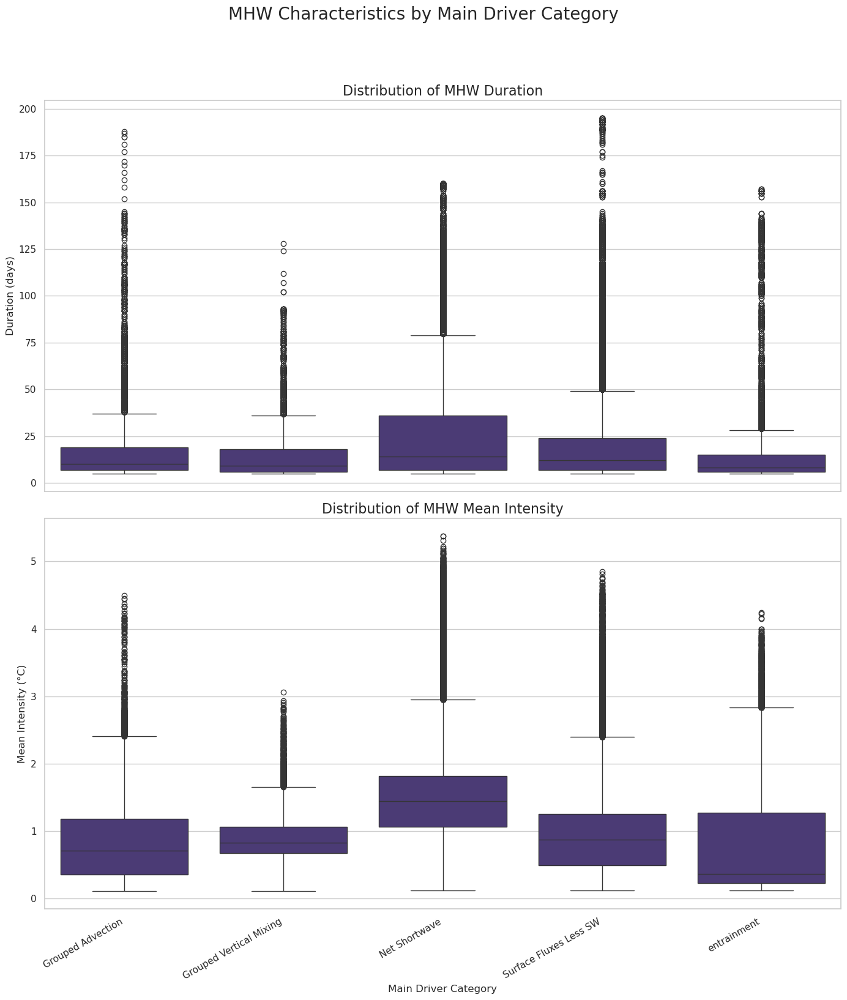


--- Analysis Complete ---


In [6]:
# =============================================================================
# MHW Driver Analysis Script
#
# This script loads two xarray datasets:
#   1. MHW event statistics (duration, intensity, etc.)
#   2. MHW driver classifications for each event.
#
# It then combines this information and generates box and whisker plots to show
# the distribution of MHW duration and mean intensity for each driver category.

# =============================================================================

import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sys


PATH_TO_DRIVER_DS = '/scratch/e14/ts7341/mhw_stats_ws.nc'
PATH_TO_MHW_STATS_DS = '/scratch/e14/ts7341/SEANOE/MHW_Statistics_Mask/full_MHW_data_1982_2024_WS.nc'


def main():
    """
    Main function to load, process, and plot the MHW data.
    """
    # --- 2. Load Data ---
    print("--- Step 1: Loading Data ---")
    try:
        print(f"Loading driver data from: {PATH_TO_DRIVER_DS}")
        ds_driver = xr.open_dataset(PATH_TO_DRIVER_DS)
        print(f"Loading MHW stats from: {PATH_TO_MHW_STATS_DS}")
        ds_mhw = xr.open_dataset(PATH_TO_MHW_STATS_DS)
    except FileNotFoundError as e:
        print(f"\nERROR: Could not find a file. Please check your paths.")
        print(f"Details: {e}")
        # sys.exit() is used to stop the script gracefully if files aren't found.
        sys.exit(1)
        
    print("\nDriver Dataset Info:")
    print(ds_driver)
    print("\nMHW Stats Dataset Info:")
    print(ds_mhw)


    # --- 3. Combine Datasets into a Pandas DataFrame ---
    print("\n--- Step 2: Combining and Cleaning Data ---")
    
    # Select the specific variables we need for the analysis
    try:
        drivers = ds_driver['main_driver']
        durations = ds_mhw['duration']
        intensities = ds_mhw['intensity_mean']
    except KeyError as e:
        print(f"\nERROR: A required variable was not found in one of the datasets.")
        print(f"Please ensure 'main_driver', 'duration', and 'intensity_mean' exist.")
        print(f"Details: {e}")
        sys.exit(1)

    # Convert each xarray DataArray to a pandas DataFrame.
    # The (lat, lon, event) coordinates become the DataFrame's index.
    df_drivers = drivers.to_dataframe()
    df_durations = durations.to_dataframe()
    df_intensities = intensities.to_dataframe()

    # Join the three DataFrames together on their common index.
    # This aligns every event's driver with its duration and intensity.
    print("Joining data based on (lat, lon, event) index...")
    df_combined = df_drivers.join(df_durations).join(df_intensities)

    # Clean the data:
    # MHW datasets often have NaNs for grid points/events that did not occur.
    # dropna() removes all rows where ANY of the values are NaN.
    # This is the crucial step to filter for only the valid MHW events.
    df_clean = df_combined.dropna()

    if df_clean.empty:
        print("\nERROR: The combined DataFrame is empty after cleaning.")
        print("This could mean there are no valid, overlapping events in your datasets,")
        print("or the variable names do not match. Please check your input files.")
        sys.exit(1)
        
    print(f"\nSuccessfully found and combined {len(df_clean)} valid MHW events.")
    print("\nSample of the final cleaned DataFrame:")
    print(df_clean.head())


    # --- 4. Create Box and Whisker Plots ---
    print("\n--- Step 3: Generating Plots ---")
    
    # Set a nice plot style
    sns.set_theme(style="whitegrid", palette="viridis")

    # Get the unique driver categories and sort them for consistent plot ordering
    driver_order = sorted(df_clean['main_driver'].unique())
    
    # Create a figure with two subplots stacked vertically
    fig, axes = plt.subplots(2, 1, figsize=(14, 16), sharex=True)
    fig.suptitle('MHW Characteristics by Main Driver Category', fontsize=20, y=1.02)

    # --- Plot 1: MHW Duration by Driver ---
    sns.boxplot(
        ax=axes[0],
        data=df_clean,
        x='main_driver',
        y='duration',
        order=driver_order
    )
    axes[0].set_title('Distribution of MHW Duration', fontsize=16)
    axes[0].set_xlabel('') # Hide x-label as it's shared
    axes[0].set_ylabel('Duration (days)', fontsize=12)

    # --- Plot 2: MHW Mean Intensity by Driver ---
    sns.boxplot(
        ax=axes[1],
        data=df_clean,
        x='main_driver',
        y='intensity_mean',
        order=driver_order
    )
    axes[1].set_title('Distribution of MHW Mean Intensity', fontsize=16)
    axes[1].set_xlabel('Main Driver Category', fontsize=12)
    axes[1].set_ylabel('Mean Intensity (°C)', fontsize=12)
    
    # Rotate x-axis labels for better readability if they are long
    plt.xticks(rotation=30, ha='right')

    # Adjust layout to prevent titles/labels from overlapping
    plt.tight_layout(rect=[0, 0, 1, 0.98])

    # Show the final plot
    plt.show()

    print("\n--- Analysis Complete ---")


if __name__ == "__main__":
    # Check if paths have been changed from their placeholder values
    if 'path/to/your' in PATH_TO_DRIVER_DS or 'path/to/your' in PATH_TO_MHW_STATS_DS:
        print("="*60)
        print("!!! PLEASE EDIT THE FILE PATHS IN THE SCRIPT !!!")
        print("="*60)
        print(f"Current driver path: {PATH_TO_DRIVER_DS}")
        print(f"Current MHW stats path: {PATH_TO_MHW_STATS_DS}")
        print("\nExiting script. Please update the paths and run again.")
    else:
        main()

## Supplementary Figure A5

In [6]:
ds = xr.open_dataset('/g/data/e14/ts7341/Figure_Code_For_Manuscript/Science/melt_during_mhw.nc')
ds

<xarray.Dataset> Size: 10MB
Dimensions:                (lat: 66, lon: 320, event: 57)
Coordinates:
  * lon                    (lon) float64 3kB -59.88 -59.62 ... 19.62 19.88
  * lat                    (lat) float64 528B -69.99 -69.88 ... -63.17 -63.06
  * event                  (event) int64 456B 0 1 2 3 4 5 ... 51 52 53 54 55 56
Data variables:
    precursor_mh_flux_sum  (lat, lon, event) float64 10MB ...

In [10]:
# =============================================================================
# MHW Regional Event Analysis - Comparison of Time Periods
#
# This script aggregates MHW pixel-events into regional events for two periods
# (All Years vs. 2017-onward) and creates a two-row comparison plot showing the
# distribution of duration, intensity, and precursor flux by dominant sub-driver,
# WITH A FIXED Y-AXIS ORDER.
# =============================================================================

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. PLOT FORMATTING & CONFIGURATION ---
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'axes.labelsize': 24,
    'axes.titlesize': 24,
    'xtick.labelsize': 20,
    'ytick.labelsize': 24,
    'legend.fontsize': 20,
    'figure.dpi': 600,
})

# --- Driver Colors and Labels ---
SUB_DRIVER_COLORS = {"Qprime_1ovrHbar": '#E69F00', "Qbar_1ovrHprime": '#CC79A7', "Qprime_1ovrHprime": 'grey'}
SUB_TERM_LABELS = {"Qprime_1ovrHbar": r"$Q'/\bar{H}$", "Qbar_1ovrHprime": r"$\bar{Q}/H'$", "Qprime_1ovrHprime": r"$Q'/H'$"}

# --- Analysis Parameters ---
MONTHS_TO_ANALYZE = [11, 12]
YEAR_SPLIT = 2017
SAVE_PLOT_PATH = '/g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/Generalised_Drivers_Combined_Fixed_Order.png'

# --- Data Paths & Binning Configuration ---
PATH_TO_DRIVER_DS = '/scratch/e14/ts7341/mhw_stats_ws.nc'
PATH_TO_MHW_STATS_DS = '/scratch/e14/ts7341/SEANOE/MHW_Statistics_Mask/full_MHW_data_1982_2024_WS.nc'
PATH_TO_PRECURSOR_DS = '/g/data/e14/ts7341/Figure_Code_For_Manuscript/Science/melt_during_mhw.nc'

LAT_BINS = np.arange(-70,-63,2.5)
LON_BINS = np.arange(-60, 21, 5)

# --- 2. HELPER FUNCTION ---
def process_and_aggregate_data(ds_driver, ds_mhw, ds_precursor, lat_bins, lon_bins, months):
    """
    Takes pre-loaded xarray Datasets, merges them, and aggregates
    pixel data into regional events.
    """
    print("--- Merging datasets ---")
    ds_combined = xr.merge([
        ds_driver['sub_driver'],
        ds_mhw['duration'],
        ds_mhw['intensity_mean'],
        ds_mhw['date_start'],
        ds_precursor['precursor_mh_flux_sum']
    ])

    df_pixels = ds_combined.to_dataframe().reset_index().dropna()
    df_pixels = df_pixels[df_pixels['sub_driver'].str.strip() != '']
    df_pixels['date_start'] = pd.to_datetime(df_pixels['date_start'])
    df_pixels['month'] = df_pixels['date_start'].dt.month

    df_filtered = df_pixels[df_pixels['month'].isin(months)].copy()
    print(f"Found {len(df_filtered)} valid pixel-level events.")

    df_filtered['lat_bin'] = pd.cut(df_filtered['lat'], bins=lat_bins, right=False)
    df_filtered['lon_bin'] = pd.cut(df_filtered['lon'], bins=lon_bins, right=False)
    df_filtered['year'] = df_filtered['date_start'].dt.year

    print("--- Aggregating into regional events ---")
    group_key = ['year', 'month', 'lat_bin', 'lon_bin']
    df_regional_events = df_filtered.groupby(group_key, observed=False).agg(
        dominant_driver=('sub_driver', lambda x: x.mode()[0]),
        mean_duration=('duration', 'mean'),
        mean_intensity=('intensity_mean', 'mean'),
        mean_precursor_flux=('precursor_mh_flux_sum', 'mean')
    ).reset_index()

    print(f"Aggregated into {len(df_regional_events)} distinct regional events.")
    return df_regional_events


# --- 3. MAIN EXECUTION ---
if __name__ == '__main__':
    # --- Pre-load and slice data to the spatial domain ONCE ---
    print("--- Loading and pre-slicing all datasets to spatial domain ---")
    lat_slice = slice(-70, -63)
    lon_slice = slice(-60, 20)

    ds_driver_full = xr.open_dataset(PATH_TO_DRIVER_DS).sel(lat=lat_slice, lon=lon_slice)
    ds_mhw_full = xr.open_dataset(PATH_TO_MHW_STATS_DS).sel(lat=lat_slice, lon=lon_slice)
    ds_precursor_full = xr.open_dataset(PATH_TO_PRECURSOR_DS).sel(lat=lat_slice, lon=lon_slice)

    # --- Analysis 1: All Years ---
    print("\n" + "="*50)
    print("ANALYSIS 1: ALL YEARS (1982-2024)")
    print("="*50)
    df_all_years = process_and_aggregate_data(
        ds_driver_full, ds_mhw_full, ds_precursor_full, LAT_BINS, LON_BINS, MONTHS_TO_ANALYZE
    )

    # --- Analysis 2: Recent Years (2017-onward) ---
    print("\n" + "="*50)
    print(f"ANALYSIS 2: RECENT YEARS ({YEAR_SPLIT}-2024)")
    print("="*50)

    year_mask = ds_mhw_full['date_start'].dt.year >= YEAR_SPLIT
    ds_driver_recent = ds_driver_full.where(year_mask, drop=True)
    ds_mhw_recent = ds_mhw_full.where(year_mask, drop=True)
    ds_precursor_recent = ds_precursor_full.where(year_mask, drop=True)

    df_recent_years = process_and_aggregate_data(
        ds_driver_recent, ds_mhw_recent, ds_precursor_recent, LAT_BINS, LON_BINS, MONTHS_TO_ANALYZE
    )

    # --- Create the 2x3 Comparison Plot ---
    print("\n--- Generating comparison plot ---")
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(26, 17), sharey=True)
    fig.suptitle('MHW Characteristics by Dominant Driver: A Comparison of Time Periods\n(Events Starting in Nov/Dec)',
                 fontsize=30, weight='bold', y=0.97)

    # =========================================================================
    # --- THE FIX: Define a FIXED, EXPLICIT order for the y-axis as requested ---
    master_driver_order = ["Qprime_1ovrHbar", "Qbar_1ovrHprime", "Qprime_1ovrHprime"]
    # =========================================================================
    
    ytick_labels_ordered = [SUB_TERM_LABELS.get(drv, drv) for drv in master_driver_order]
    print(f"\nUsing FIXED plot order: {master_driver_order}")

    plot_data = [
        (f'All Years (1982-2024)', df_all_years, axes[0]),
        (f'Recent Years ({YEAR_SPLIT}-2024)', df_recent_years, axes[1])
    ]

    for period_label, df, ax_row in plot_data:
        if df.empty:
            print(f"Skipping plot for {period_label} as no data was found.")
            for ax in ax_row:
                ax.text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=20, transform=ax.transAxes)
            continue

        ax_dur, ax_int, ax_flux = ax_row
        ax_dur.set_ylabel(period_label, fontsize=26, weight='bold')
        ax_dur.set_yticklabels(ytick_labels_ordered)

        # --- Use the 'master_driver_order' for ALL plots ---
        sns.boxplot(ax=ax_dur, data=df, y='dominant_driver', x='mean_duration',
                    order=master_driver_order, palette=SUB_DRIVER_COLORS, orient='h', hue='dominant_driver', legend=False)
        ax_dur.set_title("Duration", weight='bold')
        ax_dur.set_xlabel("Mean Duration (days)")

        sns.boxplot(ax=ax_int, data=df, y='dominant_driver', x='mean_intensity',
                    order=master_driver_order, palette=SUB_DRIVER_COLORS, orient='h', hue='dominant_driver', legend=False)
        ax_int.set_title("Cumulative Intensity", weight='bold')
        ax_int.set_xlabel("Mean Cumulative Intensity (°C / day)")

        sns.boxplot(ax=ax_flux, data=df, y='dominant_driver', x='mean_precursor_flux',
                    order=master_driver_order, palette=SUB_DRIVER_COLORS, orient='h', hue='dominant_driver', legend=False)
        ax_flux.set_title("Summed Precursor Sea-Ice Melt", weight='bold')
        ax_flux.set_xlabel("Summed Precursor Sea-Ice Melt (°C / day)")

        for ax in ax_row:
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.grid(axis='x', linestyle='--', alpha=0.7, zorder=0)
            ax.set_ylabel("")
            counts = df['dominant_driver'].value_counts()
            for i, driver in enumerate(master_driver_order):
                count = counts.get(driver, 0)
                ax.text(ax.get_xlim()[1] * 1.01, i, f" n={count}", ha='left', va='center', fontsize=18, color='dimgray')

    # Add panel labels (a, b, c, d, e, f)
    panel_label_props = {'size': 28, 'weight': 'bold'}
    axes[0, 0].text(-0.25, 1.02, '(a)', transform=axes[0, 0].transAxes, **panel_label_props)
    axes[0, 1].text(-0.1, 1.02, '(b)', transform=axes[0, 1].transAxes, **panel_label_props)
    axes[0, 2].text(-0.1, 1.02, '(c)', transform=axes[0, 2].transAxes, **panel_label_props)
    axes[1, 0].text(-0.25, 1.02, '(d)', transform=axes[1, 0].transAxes, **panel_label_props)
    axes[1, 1].text(-0.1, 1.02, '(e)', transform=axes[1, 1].transAxes, **panel_label_props)
    axes[1, 2].text(-0.1, 1.02, '(f)', transform=axes[1, 2].transAxes, **panel_label_props)

    fig.subplots_adjust(top=0.90, hspace=0.4, wspace=0.25)

    if SAVE_PLOT_PATH:
        plt.savefig(SAVE_PLOT_PATH, dpi=300, bbox_inches='tight')
        print(f"\nComparison plot saved to {SAVE_PLOT_PATH}")
    plt.show()

--- Loading and pre-slicing all datasets to spatial domain ---

ANALYSIS 1: ALL YEARS (1982-2024)
--- Merging datasets ---
Found 151522 valid pixel-level events.
--- Aggregating into regional events ---
Aggregated into 2688 distinct regional events.

ANALYSIS 2: RECENT YEARS (2017-2024)
--- Merging datasets ---
Found 35398 valid pixel-level events.
--- Aggregating into regional events ---
Aggregated into 448 distinct regional events.

--- Generating comparison plot ---

Using FIXED plot order: ['Qprime_1ovrHbar', 'Qbar_1ovrHprime', 'Qprime_1ovrHprime']


/jobfs/153296025.gadi-pbs/ipykernel_3209783/3950511679.py:145: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_dur.set_yticklabels(ytick_labels_ordered)
/jobfs/153296025.gadi-pbs/ipykernel_3209783/3950511679.py:145: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_dur.set_yticklabels(ytick_labels_ordered)



Comparison plot saved to /g/data/e14/ts7341/Figure_Code_For_Manuscript/Figures_Images/Generalised_Drivers_Combined_Fixed_Order.png
